# Upper limit analysis with QuickCW samples

In this notebook we calculate upper limits based on QuickCW samples. You can either use samples from a run you did with the `running_quickcw.ipynb` notebook or you can use the samples provided based on long QuickCW runs. If you use your own run, make sure to set `amplitude_prior='UL'`. If you use the provided samples, make sure to use the one ran with the right prior (`data/15yr_quickCW_UL.h5`).

In [1]:
#imports
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%load_ext line_profiler
%load_ext snakeviz
%autoreload 2

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import corner

import pickle

import enterprise
from enterprise.pulsar import Pulsar
import enterprise.signals.parameter as parameter
from enterprise.signals import utils
from enterprise.signals import signal_base
from enterprise.signals import selections
from enterprise.signals.selections import Selection
from enterprise.signals import white_signals
from enterprise.signals import gp_signals
from enterprise.signals import deterministic_signals
import enterprise.constants as const

from enterprise_extensions import deterministic, model_utils

from scipy.stats import norm

import libstempo as T2
import libstempo.toasim as LT
import libstempo.plot as LP

import glob
import json
import h5py
import healpy as hp
import scipy.constants as sc
import emcee

from numba.typed import List

from statsmodels.stats.weightstats import DescrStatsW

import QuickCW
from QuickCW import OutputUtils

from matplotlib import gridspec

In [6]:
#First we read in the hdf5 file

#hdf_file = "quickCW_test.h5"
hdf_file = "data/15yr_quickCW_UL.h5"

#specify how much of the first samples to discard
#(no need to discard any for provided samples as that has already been done)
#and how much more to thin the samples in addition to what we already thinned when we saved the samples
#burnin = 100_000
burnin = 0
extra_thin = 1

with h5py.File(hdf_file, 'r') as f:
    print(list(f.keys()))
    Ts = f['T-ladder'][...]
    samples_cold = f['samples_cold'][0,burnin::extra_thin,:]
    print(f['samples_cold'].dtype)
    #samples = f['samples_cold'][...]
    log_likelihood = f['log_likelihood'][:,burnin::extra_thin]
    print(f['log_likelihood'].dtype)
    #log_likelihood = f['log_likelihood'][...]
    par_names = [x.decode('UTF-8') for x in list(f['par_names'])]
    acc_fraction = f['acc_fraction'][...]
    fisher_diag = f['fisher_diag'][...]

print(samples_cold.shape)
print(log_likelihood.shape)

['T-ladder', 'acc_fraction', 'fisher_diag', 'log_likelihood', 'par_names', 'samples_cold']
float32
float64
(123750, 278)
(1, 123750)


7974981.669079403
121903


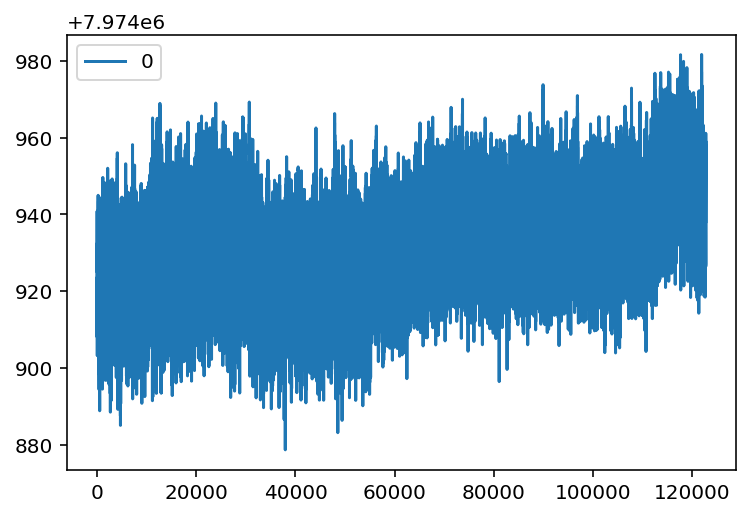

In [7]:
#plot the trace of the likelihood values and amplitude samples to see if its sensible
for j in range(1):
    #plt.figure()
    plt.plot(log_likelihood[j,1_000::1], label=str(j))
    print(np.max(log_likelihood[j,1_000::1]))
    print(np.argmax(log_likelihood[j,1_000::1]))
    
plt.legend(loc=2)

/tmp/ipykernel_98341/599206494.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


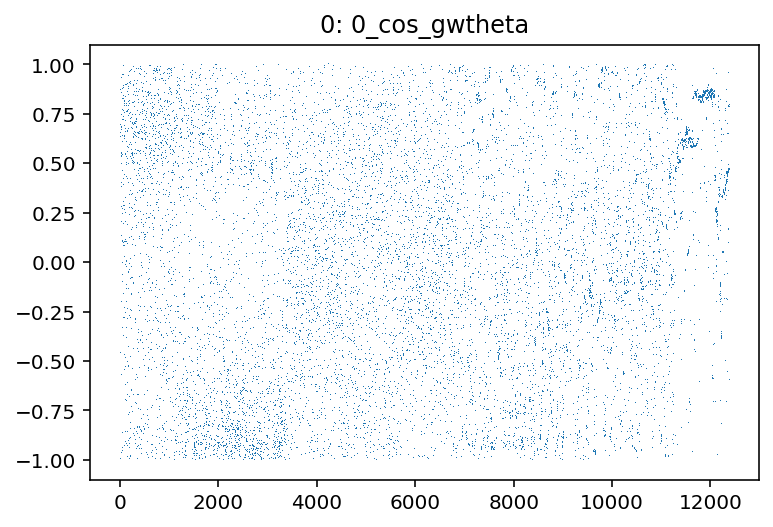

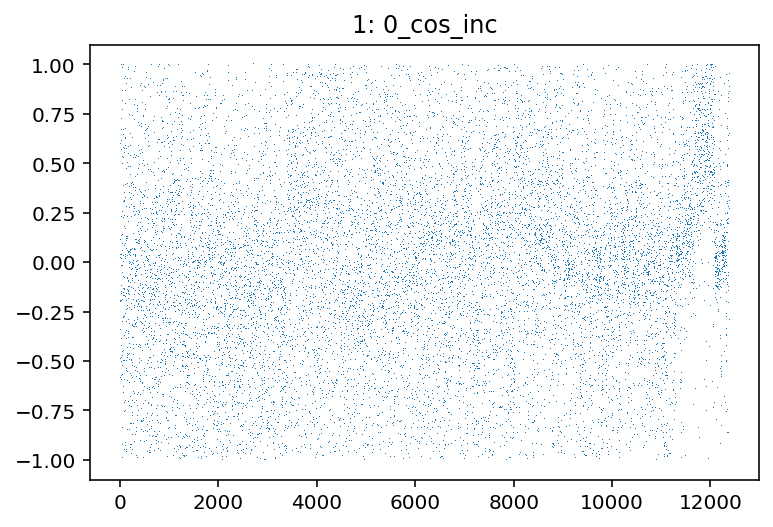

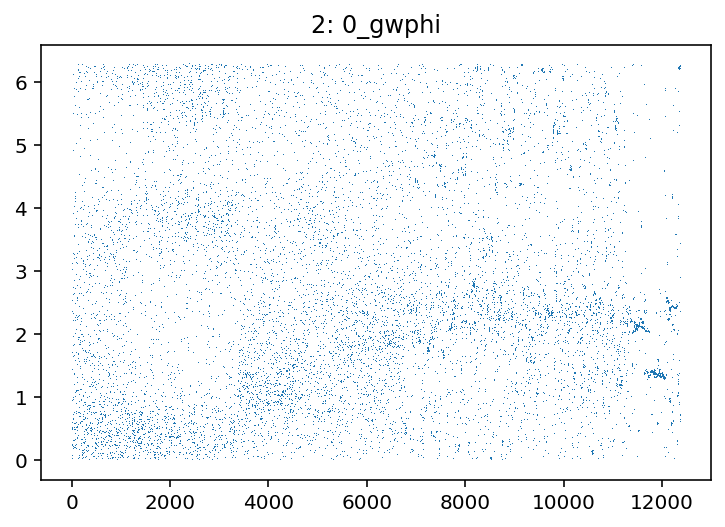

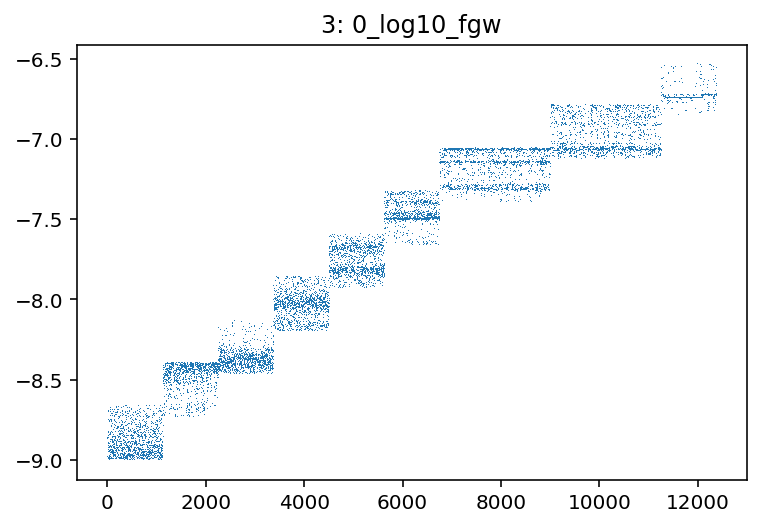

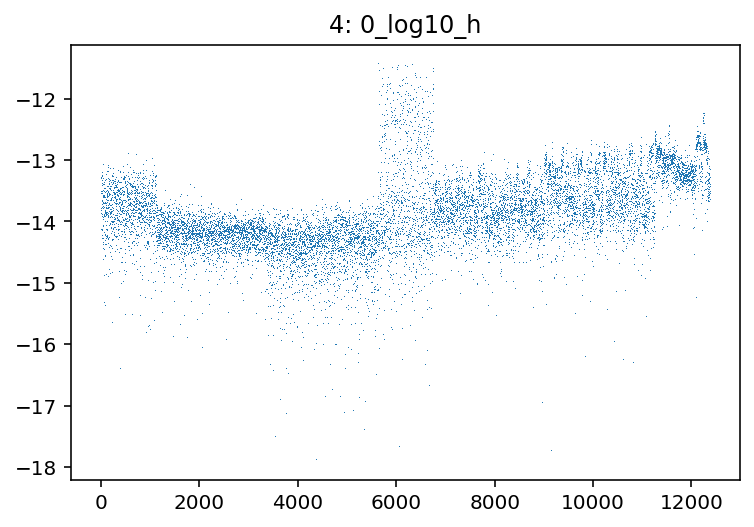

...

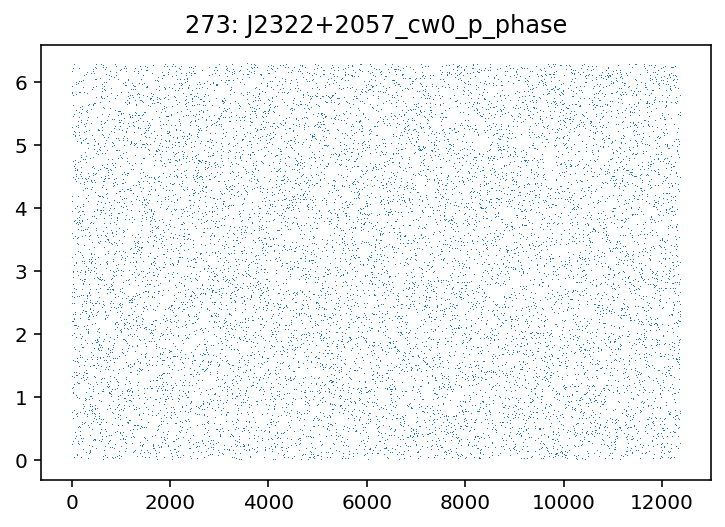

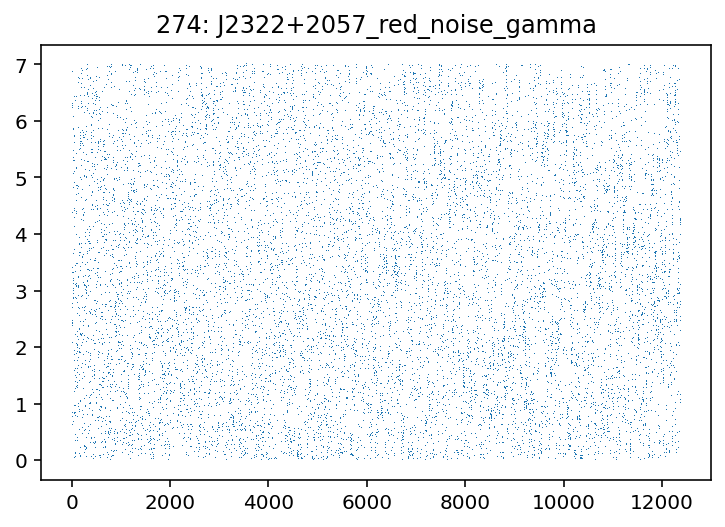

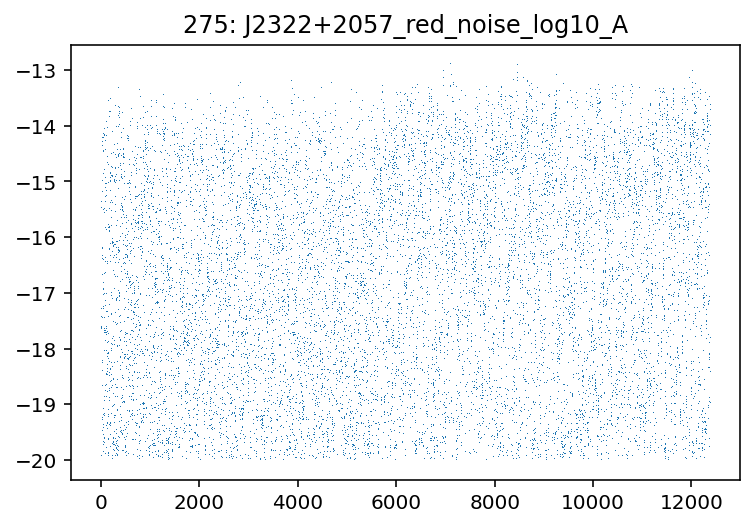

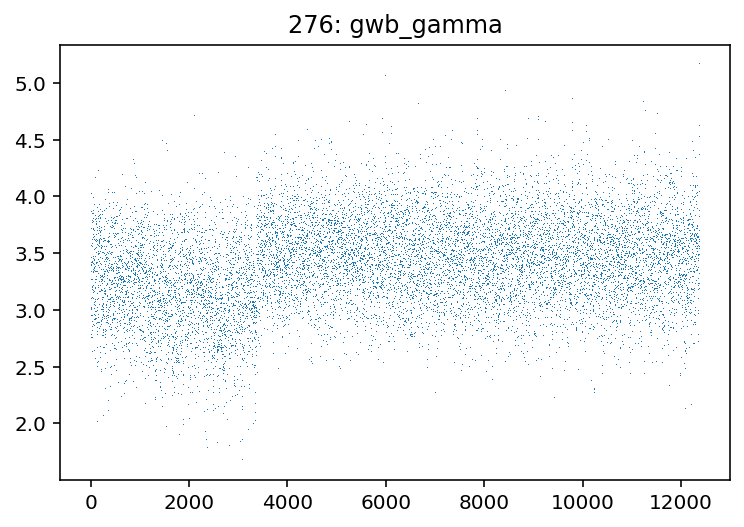

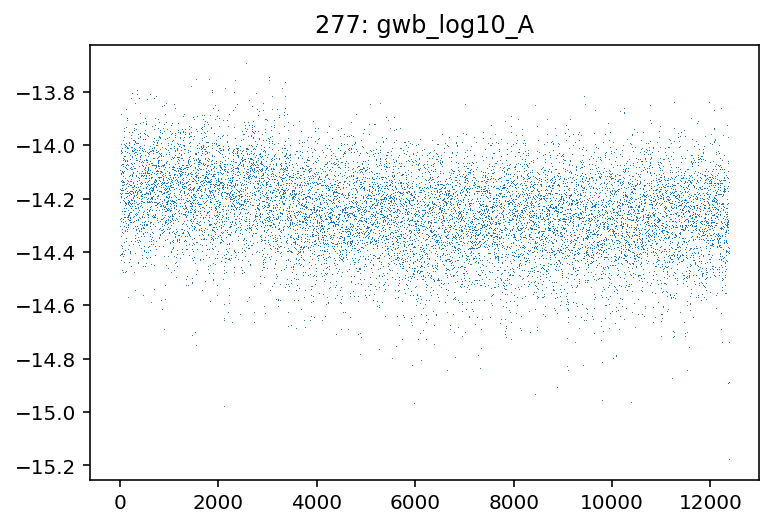

In [8]:
#plot trace of all parameters (useful run diagnostic)
#for the provided runs these might show big jumps
#this is due to the fact that those were made by concatenating multiple runs done on different frequency ranges

burnin = 0
thin = 10

for i, par in enumerate(par_names):
    plt.figure(i)
    plt.plot(samples_cold[burnin::thin,i], ls='', marker=',')
    
    plt.title(str(i) + ": " + par)

In [9]:
#define function to calculate upper limits

def get_UL_vs_freq(log10_fgws, log10_hs, f_bounds, n_bins, debug_plot=False):
    f_min = f_bounds[0]
    f_max = f_bounds[1]
    
    f_bins = np.logspace(np.log10(f_min), np.log10(f_max), n_bins+1)#100)
    print(f_bins)

    f_bincenters = []
    for i in range(f_bins.size-1):
        f_bincenters.append((f_bins[i+1]+f_bins[i])/2)
    f_bincenters = np.array(f_bincenters)
    print(f_bincenters)

    log10_h_bins = np.linspace(-18,-11,100)

    plt.figure(0, figsize=(8,7))
    #h, xedges, yedges, _ = plt.hist2d(log10_fgws, log10_hs, bins=50, range=[[np.log10(3.5e-9),-7],[-18,-11]])
    #h, xedges, yedges, _ = plt.hist2d(log10_fgws, log10_hs, bins=100, range=[[np.log10(3.5e-9),-7],[-15.5,-11]],
    #                                  weights=log10_fgws*0+1/60.0)
    h, xedges, yedges, _ = plt.hist2d(log10_fgws, log10_hs, bins=[np.log10(f_bins), log10_h_bins])
    print(10**xedges)

    #make bin centers
    bincenters = []
    for i in range(xedges.size-1):
        bincenters.append((xedges[i+1]+xedges[i])/2)
    bincenters = np.array(bincenters)
    print(10**bincenters)

    freq_idx = np.digitize(log10_fgws, xedges)

    UL_freq = np.zeros(bincenters.size)
    UL_sigma = np.zeros(bincenters.size)
    for i in range(bincenters.size):
        print('---')
        print(i)
        hs = 10**log10_hs[np.where(freq_idx==i+1)]
        if hs.size==0:
            UL_freq[i] = 0.0
            continue

        #normal UL
        UL_freq[i] = np.percentile(hs, 95)

        cc = emcee.autocorr.integrated_time(hs, c=10, quiet=True)
        N_eff = hs.size/cc
        print(N_eff)

        h_bins = np.linspace(0, np.max(hs), 100)
        hist, bin_edges = np.histogram(hs, bins=h_bins, density=True)
        ul_idx = np.where(UL_freq[i]<bin_edges)[0][0]-1
        UL_sigma[i] = np.sqrt(0.95*(1-0.95)/N_eff)/hist[ul_idx]
        #print(UL_freq[i])
        #print(bin_edges[ul_idx])
        #print(bin_edges[ul_idx+1])
        #print(hist[ul_idx])
        #print(UL_sigma[i])

        if debug_plot:
            plt.figure(i+1)
            plt.plot(hs)
            plt.gca().axhline(UL_freq[i])
            plt.gca().axhline(UL_freq[i]+UL_sigma[i], ls='-.')
            plt.gca().axhline(UL_freq[i]-UL_sigma[i], ls='-.')
            
    return UL_freq, UL_sigma, bincenters, xedges

1
(123750,)
(123750,)
1e-09 3e-07
[1.00000000e-09 1.16667320e-09 1.36112636e-09 1.58798966e-09
 1.85266498e-09 2.16145459e-09 2.52171115e-09 2.94201283e-09
 3.43236753e-09 4.00445122e-09 4.67188594e-09 5.45056413e-09
 6.35902712e-09 7.41890654e-09 8.65543947e-09 1.00980693e-08
 1.17811469e-08 1.37447483e-08 1.60356296e-08 1.87083393e-08
 2.18265182e-08 2.54644139e-08 2.97086494e-08 3.46602851e-08
 4.04372259e-08 4.71770279e-08 5.50401743e-08 6.42138965e-08
 7.49166324e-08 8.74032275e-08 1.01971003e-07 1.18966837e-07
 1.38795421e-07 1.61928899e-07 1.88918107e-07 2.20405693e-07
 2.57141416e-07 3.00000000e-07]
[1.08333660e-09 1.26389978e-09 1.47455801e-09 1.72032732e-09
 2.00705978e-09 2.34158287e-09 2.73186199e-09 3.18719018e-09
 3.71840938e-09 4.33816858e-09 5.06122504e-09 5.90479563e-09
 6.88896683e-09 8.03717301e-09 9.37675438e-09 1.09396081e-08
 1.27629476e-08 1.48901890e-08 1.73719845e-08 2.02674288e-08
 2.36454661e-08 2.75865316e-08 3.21844673e-08 3.75487555e-08
 4.38071269e-08 5.1

/tmp/ipykernel_98341/1960805813.py:62: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i+1)
The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 67;
tau: [119.66789608]
The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 196;
tau: [297.67608281]


---
24
[188.73651438]
---
25
[216.89247317]
---
26
[349.83257691]
---
27
[362.07730804]
---
28
[348.2327221]
---
29
[27.94400261]
---
30
[295.35956114]
---
31
[100.95223356]
---
32
[173.00834517]
---
33
[32.86458189]
---
34
[192.05040355]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 10;
tau: [11.52932539]
The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 7;
tau: [15.95077138]


---
35
[42.3268477]
---
36
[22.31866984]


NameError: name 'official_11yr_skyavg' is not defined

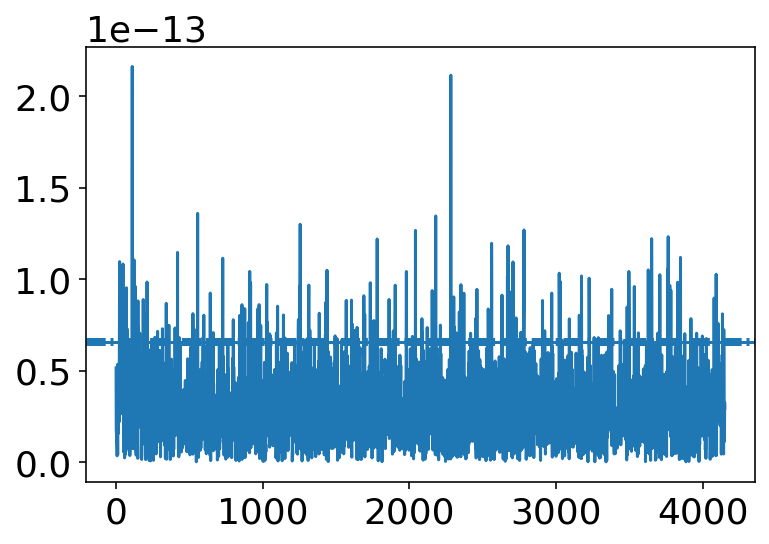

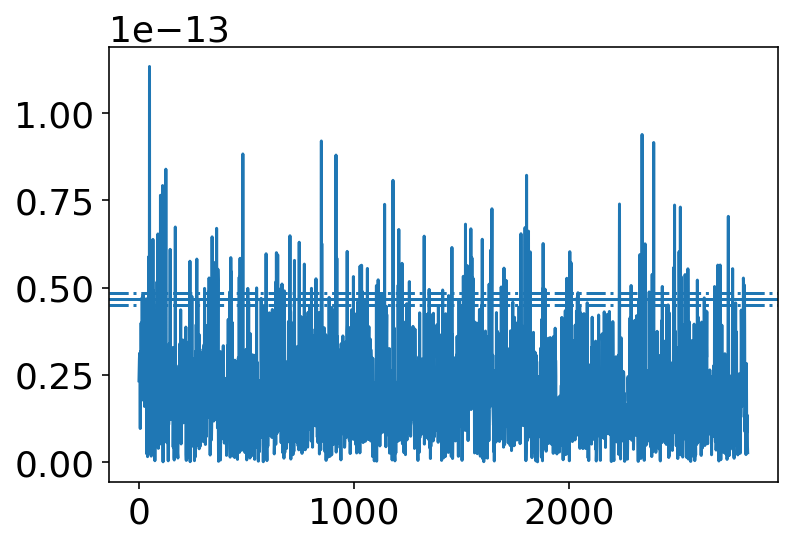

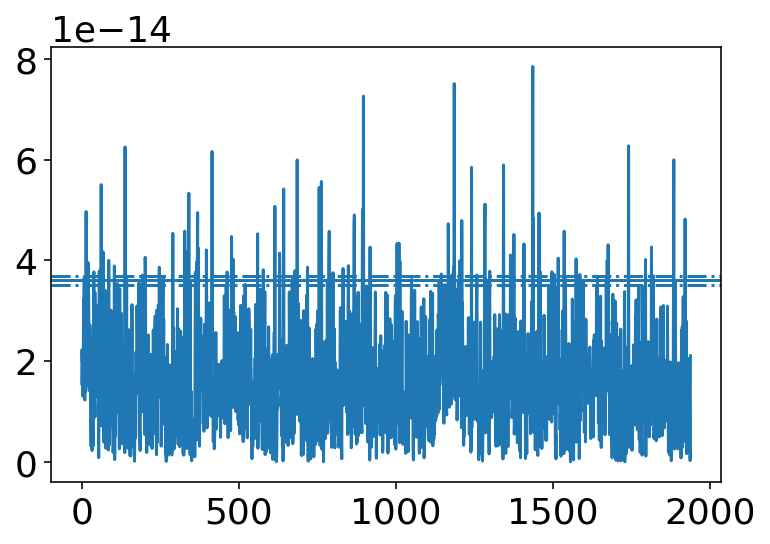

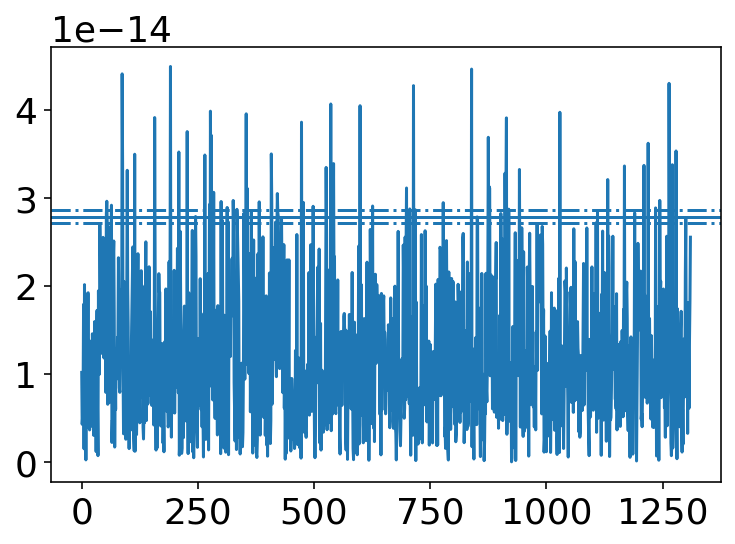

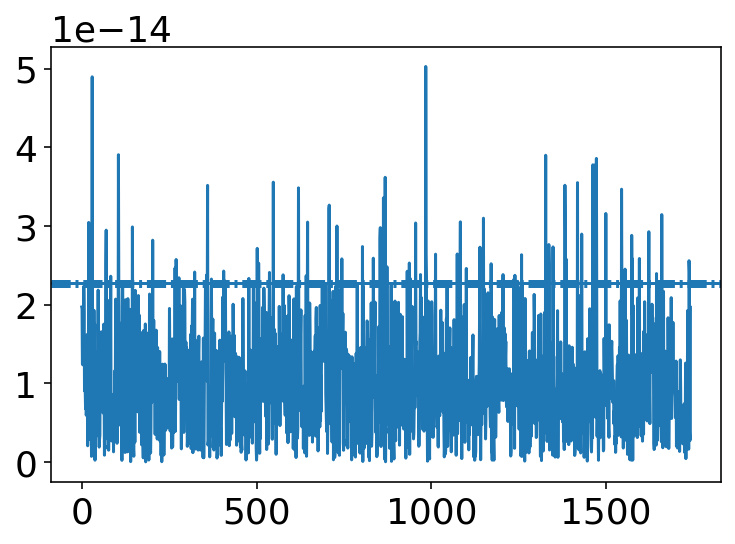

...

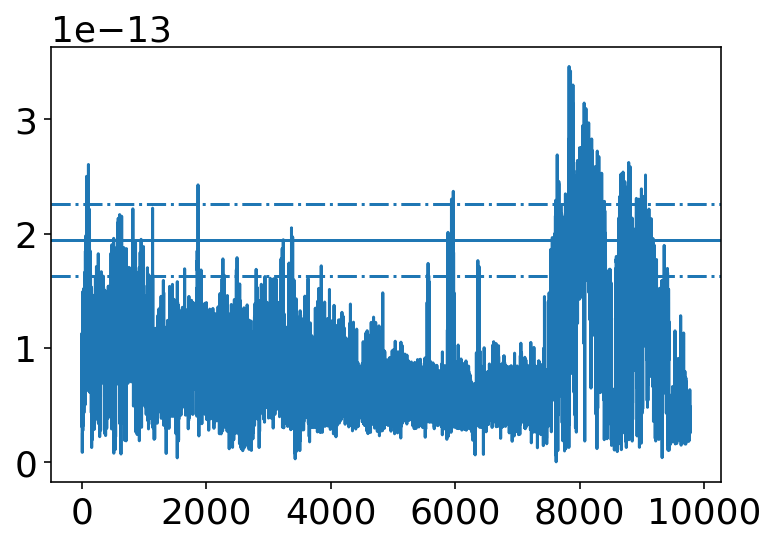

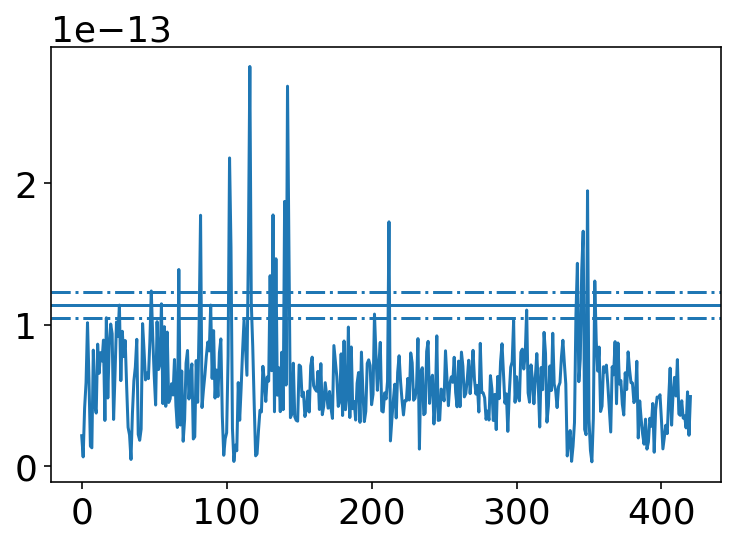

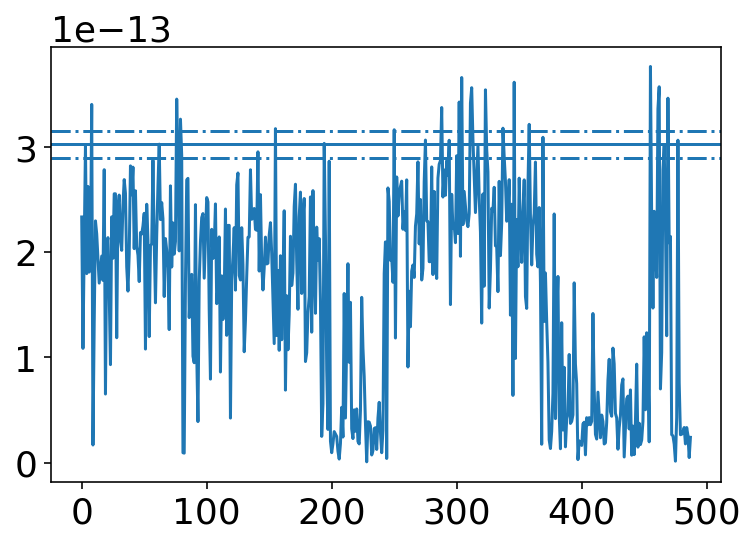

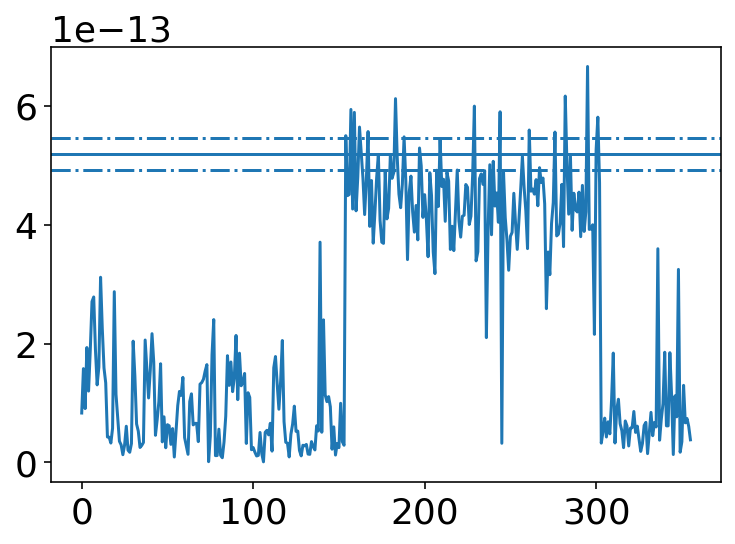

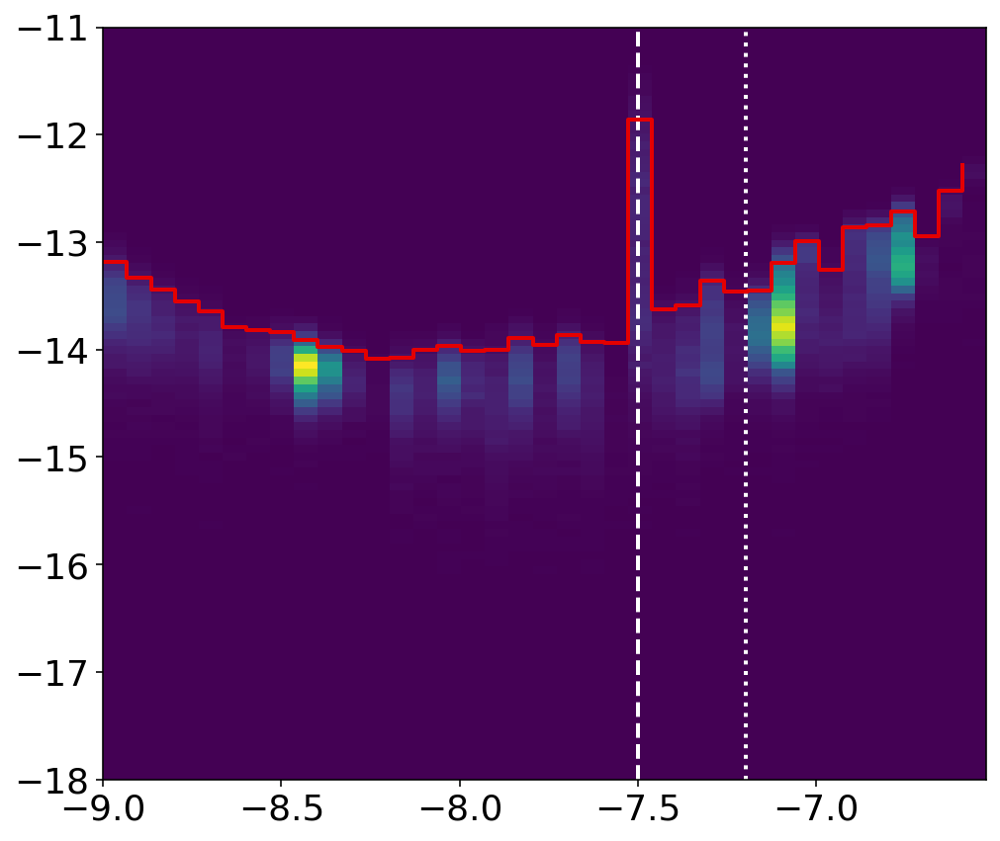

In [10]:
%%time
#uniform prior
plt.rcParams.update({'font.size': 18})

burnin = 0
thin=1
print(thin)

log10_fgws = samples_cold[burnin::thin,3]
log10_hs = samples_cold[burnin::thin,4]
print(log10_fgws.shape)
print(log10_hs.shape)

f_min = 1e-9
f_max = 3e-7
print(f_min, f_max)

n_bins=37#50

UL_freq, UL_sigma, bincenters, xedges = get_UL_vs_freq(log10_fgws, log10_hs, [f_min,f_max], n_bins,
                                                       debug_plot=True)



plt.figure(0)
plt.gca().axvline(x=-np.log10(3600*24*365.24), ls='--', lw=2, color='white', label='1/yr')
plt.gca().axvline(x=-np.log10(3600*24*365.24*0.5), ls=':', lw=2, color='white', label='2/yr')
plt.errorbar(xedges[:-1], np.log10(UL_freq), ls='-', lw=2, color="xkcd:red",
             drawstyle='steps-post', label="95% UL - this run")
plt.plot(np.log10(official_11yr_skyavg[:,0]), np.log10(official_11yr_skyavg[:,1]),
         ls='--', lw=2, marker='x', color="xkcd:green", label="95% UL - official 11yr")
plt.ylim(-15,-11)
#plt.xlim(-8.75, -7.0)
plt.xlabel(r"$\log_{10} f_{\rm GW}$")
plt.ylabel(r"$\log_{10} A_{\rm e}$")

cbar = plt.colorbar(location='top')
cbar.set_label('#')

plt.legend(loc=2)

plt.tight_layout()

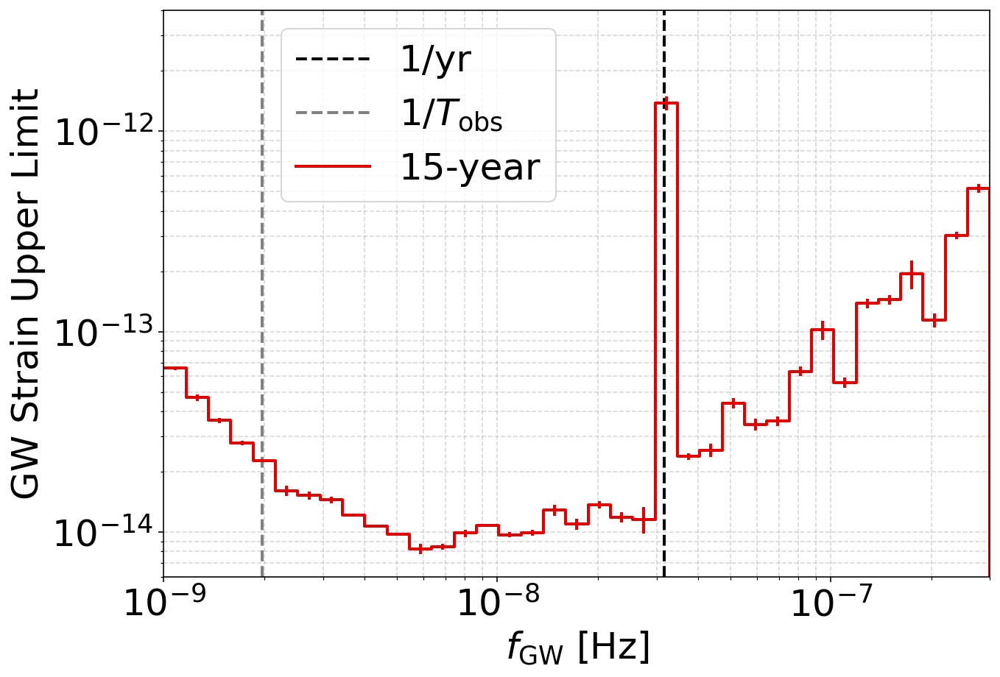

In [11]:
matplotlib.rcParams.update({'font.size': 25})

plt.figure(figsize=(10,7))

plt.gca().axvline((365.25*86400)**-1, color='black', ls='--', lw=2, label='1/yr')
plt.gca().axvline(10**-8.704, color='gray', ls='--', lw=2, label=r'$1/T_{\rm obs}$')

#plt.errorbar(10**bincenters, UL_freq, yerr=UL_freq_error,
#             ls='', lw=2, marker='', alpha=1.0, color="xkcd:red")

plt.errorbar(10**bincenters, UL_freq, yerr=UL_sigma,
             ls='', lw=2, marker='', alpha=1.0, color="xkcd:red")

#print(xedges)
#print(len(xedges))
#print(UL_freq)
#print(UL_freq_reweight)
#print(UL_freq_error)


plt.step(10**xedges, np.concatenate((UL_freq, [0.0,])), where='post',
             ls='-', lw=2, marker='', alpha=1.0, color="xkcd:red", label="15-year")

plt.xscale('log')
plt.yscale('log')
plt.ylim(6e-15,4e-12)
plt.xlim(1e-9, 3e-7)
plt.xlabel(r"$f_{\rm GW}$ [Hz]")
#plt.ylabel(r"$A_{\rm e}$")
plt.ylabel(r"GW Strain Upper Limit")

#plt.gca().axvline(10**(-7.6))

plt.legend(bbox_to_anchor=(0.12,1), loc="upper left")
#plt.legend(loc="upper right")
plt.grid(which='both', linestyle='--', alpha=0.5)

plt.tight_layout()